<h1>Data presentation script

<h2>Imports

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.backends.backend_pdf
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

<h3>Fundamental functions

In [19]:
pd.set_option("mode.chained_assignment", None)

def getChromossome(df, n):
    """Returns pandas dataframe with only the citobands of one chromossome n
    """
    chomossome = str(n)
    chr_array = []
    #print("dataframe columns = ", df.columns)
    #chr_array.append(['Chromossome','First_index', 'Last_index', "Citoband", 'Unkown'])
    for row in df.values:
        cyto_array = []
        if row[0] == chomossome:
            for col in row:
                cyto_array.append(col)
            chr_array.append(cyto_array)
    return pd.DataFrame(chr_array, columns=df.columns)


def createLabels(citobands, dens):
    labels = citobands.values
    for i in range(len(dens.values)):
        if dens[i] <= 0.1:
            labels[i] = " "
    return labels

def createLabels2(citobands):
    labels = citobands.values
    labels[-1] = ""
    centromere = []
    found = False   
    for i in range(0, len(labels)-1):
        if labels[i][0] == "p" and labels[i+1][0] == "q":
            centromere.append(i)
            centromere.append(i+1)
            found = True
    if found == True:
        for i in range(0, len(labels)-1):
            if i not in centromere:
                labels[i] = ""
    return labels
    

def plotAll(cb_df, density):                            # "STR_Density" or "DR_density"
    #figure, axis = plt.subplots(8, 3, figsize=(60,80))
    figure, axis = plt.subplots(4, 6, figsize=(120,40))
    chromossomes = cb_df["Chromossome"].unique()
    chromossomes = list(map(str, chromossomes))
    chromossomes.remove("chrM")
    chr_n = 0
    for i in range(4):
        for j in range(6):
            chr_df = getChromossome(cb_df, chromossomes[chr_n])
            axis[i, j].plot(chr_df["Citoband"], chr_df[density], 'ro--', linewidth=1, markersize=4)
            axis[i, j].set_yscale('log')
            plt.grid()
            axis[i, j].set_title("STR densities in chromossome: " + chromossomes[chr_n], fontweight="bold", size=32)
            #axis[i, j].tick_params(axis='x', color='m', length=4, direction='in', width=4,
            #           labelcolor='g', grid_color='b')
            #labels = createLabels(chr_df["Citoband"], chr_df[density])
            labels = createLabels2(chr_df["Citoband"])
            axis[i,j].set_xticks(np.arange(len(chr_df["Citoband"])), labels, rotation=35, fontsize = 24)
            axis[i,j].tick_params(axis='both', which='major', labelsize=22)
            axis[i,j].tick_params(axis='both', which='minor', labelsize=22)
            chr_n += 1
            
            #axis.invert_yaxis()
    #figure.autofmt_xdate()
    
    #plt.savefig("images/STRsDensity_Chromosomes_horizontal.pdf", format="pdf", bbox_inches="tight")
    plt.savefig("images/" + density + "Chromosomes_horizontal.png", format="png", bbox_inches="tight", dpi=300)
    #plt.show()


def plot_1chr(cb_df, chromossome, dens_type):      #dens_types: "STR_Density" "DR_density"
    chr_df = getChromossome(cb_df, str(chromossome))
    fig, ax = plt.subplots(figsize=(12, 8))#, layout='constrained')
    ax.plot(chr_df["Citoband"], chr_df[dens_type], 'ro--', linewidth=2, markersize=6, label = dens_type)
    ax.axvline(x=5, color = "black")
    ax.axvline(x=6, color = "black")
    ax.set_yscale('log')
    ax.set_xlabel("Cytoband")
    ax.set_ylabel(dens_type)
    ax.grid()
    ax.legend()
    ax.label_outer()
    ax.set_title(dens_type + ' in chromosome ' + chromossome, fontweight="bold", size=22)
    fig.autofmt_xdate()
    fig.savefig("images/" + chromossome + dens_type + ".pdf", format="pdf", bbox_inches="tight")
    #fig.savefig("images/" + chromossome + "STR_density.png", format="png", bbox_inches="tight")

<h3>Data preparation for making map functions

In [4]:
def makeMap_dens(cb_df, density):        #dens_types: "STR_Density" "DR_density"
    """Make a map of the densities
    """
    chromossomes = cb_df["Chromossome"].unique()
    chromossomes = list(map(str, chromossomes))
    chromossomes.remove("chrM")
    cytobands = cb_df["Citoband"].unique()
    cytobands = list(map(str, cytobands))
    mapping = []
    row_count = 0
    for chromosome in chromossomes:
        chr_subset = cb_df.get(cb_df["Chromossome"] == chromosome)
        cytobands = chr_subset["Citoband"].unique()
        ps = np.zeros(34, dtype=(float, 1))
        qs = np.zeros(38, dtype=(float, 1))
        for n in range(len(ps)):
            ps[n] = np.nan
        for n in range(len(qs)):
            qs[n] = np.nan
        pcount = -1
        qcount = 0
        p_list = []
        q_list = []
        count = row_count
        if chromosome == "chrX" or chromosome == "chrY":
            count += 1
        for row in range (len(chr_subset.values)):
            if count>=63:
                row += count
            cytoband = chr_subset["Citoband"][row]
            dens = chr_subset[density][row]
            if cytoband[0] == "p":
                p_list.append(dens)
            elif cytoband[0] == "q":
                q_list.append(dens)
            row_count+=1
        p_list.reverse()
        for p in p_list:
            ps[pcount] = p
            pcount -= 1
        for q in q_list:
            qs[qcount] = q
            qcount += 1

        ps_list = ps.tolist()
        qs_list = qs.tolist()
        pqs = ps_list + qs_list
        
        mapping.append(pqs)
    return mapping


def makeMap_dict(cb_df, density):
    chromossomes = cb_df["Chromossome"].unique()
    chromossomes = list(map(str, chromossomes))
    chromossomes.remove("chrM")
    cytobands = cb_df["Citoband"].unique()
    cytobands = list(map(str, cytobands))
    
    mapping = {}
    row_count = 0
    for chromosome in chromossomes:
        chr_subset = cb_df.get(cb_df["Chromossome"] == chromosome)
        ps = np.zeros(34, dtype=(list, 2))
        qs = np.zeros(38, dtype=(list, 2))
        pcount = -1
        qcount = 0
        count = row_count
        p_list = []
        q_list = []
        if chromosome == "chrX" or chromosome == "chrY":
            count += 1
        for row in range (len(chr_subset.values)):
            if count>=63:
                row += count
            cytoband = chr_subset["Citoband"][row]
            dens = chr_subset[density][row]
            if cytoband[0] == "p":
                p_list.append([cytoband, dens])
            elif cytoband[0] == "q":
                q_list.append([cytoband, dens])
            row_count+=1
        p_list.reverse()
        for p in p_list:
            ps[pcount] = p
            pcount -= 1
        for q in q_list:
            qs[qcount] = q
            qcount += 1
        ps_list = ps.tolist()
        qs_list = qs.tolist()
        pqs = ps_list + qs_list
        for n in range(len(pqs)):
            if pqs[n] == [0, 0]:
                pqs[n] = np.nan
        mapping.update({chromosome : pqs})
    return mapping

<h3>Create a colormap

In [5]:
plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14) 
font = {'family' : 'sans-serif',
        'weight' : 'normal',
        'size'   : 14}

plt.rc('font', **font)

In [24]:
green = np.array([1/10, 9/10, 1/10, 0.7])

lYelw = np.array([10/10, 10/10, 7/10, 1])
yelw = np.array([10/10, 10/10, 4/10, 1])
dYelw = np.array([10/10, 9/10, 0/10, 0.7])

lOrng = np.array([10/10, 7/10, 1/10, 0.9])
orng = np.array([10/10, 5/10, 1/10, 0.9])
dOrng = np.array([10/10, 3/10, 1/10, 0.9])

lred = np.array([10/10, 1/10, 1/10, 0.9])
Red = np.array([7/10, 1/10, 1/10, 0.95])
dRed = np.array([4/10, 1/10, 1/10, 1])

white = np.array([0/10, 0/10, 0/10, 0])

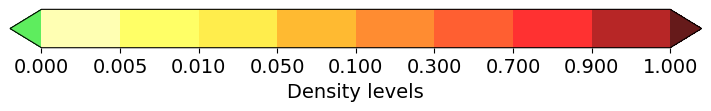

In [6]:
fig, ax = plt.subplots(figsize=(7, 1), layout='constrained')

colormap = plt.cm.YlOrRd
newColorMap = colormap(np.linspace(0, 1, 512))
newColorMap[0, :] = green
#newcmp = ListedColormap(newColorMap)

colormap = (mpl.colors.ListedColormap([green, lYelw, yelw, dYelw, lOrng, orng, dOrng, lred, Red, dRed]))
        #.with_extremes(under='yellow', over='magenta'))


bounds = [0, 0.005, 0.010, 0.05, 0.1, 0.3, 0.7, 0.9, 1]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')
#norm = mpl.colors.LogNorm()#bounds[0], bounds[len(bounds)-1])
mappable = mpl.cm.ScalarMappable(cmap=colormap, norm=norm)

cmap = mappable.get_cmap()

fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=colormap),
             cax=ax, orientation='horizontal', label='Density levels')

map_legend = plt.gcf()

plt.savefig('images/mapLegend.pdf', format="pdf", bbox_inches="tight")

In [23]:
def cColours(data):
    coloursMap = []
    for row in data:
        colours = []
        for col in row:
            if col == 0.0:
                colours.append(green)
            elif 0.0 < col < 0.005:
                colours.append(lYelw)
            elif 0.005 <= col < 0.015:
                colours.append(yelw)
            elif 0.015 <= col < 0.030:
                colours.append(dYelw)
            elif 0.030 <= col < 0.050:
                colours.append(lOrng)
            elif 0.050 <= col < 0.100:
                colours.append(orng)
            elif 0.100 <= col < 0.500:
                colours.append(dOrng)
            elif 0.500 <= col < 0.900:
                colours.append(lred)
            elif 0.900 <= col < 1:
                colours.append(Red)
            elif col == 1:
                colours.append(dRed)
            else:
                colours.append(white)
        coloursMap.append(colours)

    return coloursMap
    

In [8]:
def cColours2(data):
    coloursMap = []
    for row in data:
        colours = []
        for col in row:
            if col == 0.0:
                colours.append(green)
            elif 0.0 < col < 0.01:
                colours.append(lYelw)
            elif 0.01 <= col < 0.05:
                colours.append(yelw)
            elif 0.05 <= col < 0.10:
                colours.append(dYelw)
            elif 0.10 <= col < 0.20:
                colours.append(lOrng)
            elif 0.20 <= col < 0.40:
                colours.append(orng)
            elif 0.40 <= col < 0.60:
                colours.append(dOrng)
            elif 0.500 <= col < 0.900:
                colours.append(lred)
            elif 0.900 <= col < 1:
                colours.append(Red)
            elif col == 1:
                colours.append(dRed)
            else:
                colours.append(white)
        coloursMap.append(colours)

    return coloursMap

<h3>Function to make map

In [25]:
def plotMap(data, dict):
    
    #mais tarde inverter as linhas com as colunas
    rows = ('chr1', 'chr2', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr19', 'chr20', 'chr21', 'chr22', 'chrX', 'chrY')
    cols = ["p34", "p33", "p32", "p31", "p30", "p29", "p28", "p27", "p26", "p25", "p24", "p23", "p22", "p21", "p20", "p19", "p18", "p17", "p16", "p15", "p14", "p13", "p12", "p11", "p10", "p09", "p08", "p07", "p06", "p05", "p04", "p03", "p02", "p01-centromer", "q01-centromer", "q02", "q03", "q04", "q05", "q06", "q07", "q08", "q09", "q10", "q11", "q12", "q13", "q14", "q15", "q16", "q17", "q18", "q19", "q20", "q21", "q22", "q23", "q24", "q25", "q26", "q27", "q28", "q29", "q30", "q31", "q32", "q33", "q34", "q35", "q36", "q37", "q38"]
    
    n_rows = len(data)
    n_cols = len(data[0])

    # Plot bars and create text labels for the table
    cell_text = []
    for row in rows:
        #string = "cytoband: " + str(dict[row][0]) + " density: " + str(dict[row][1])
        cell_text.append(dict[row])

    #Get some lists of color specs for row and column headers
    rcolors = plt.cm.BuPu(np.full(len(rows), 0.1))
    ccolors = plt.cm.BuPu(np.full(len(cols), 0.1))
    #cellcolours = plt.cm.YlOrRd(data)#.set_bad(color='white')         #coolwarm, Greys
    #cellcolours = cmap(data)
    cellcolours = cColours(data)
    
    fig = plt.figure(linewidth=2,
           #edgecolor=fig_border,
           #facecolor=fig_background_color,
           tight_layout={'pad':1},
           figsize = (96,36),
          )
    
    the_table = plt.table(cellText=cell_text,
                      rowLabels=rows,
                      colLabels=cols,
                      rowLoc='right',
                      rowColours=rcolors,
                      colColours=ccolors,
                      cellColours=cellcolours,
                      loc='center')
    
    the_table.auto_set_font_size(False)
    the_table.set_fontsize(11)
    the_table.scale(1.6, 12)
    # Hide axes
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # Hide axes border
    plt.box(on=None)
    
    plt.draw()
    #axis1 = fig.add_subplot(211)
    #colormap = (mpl.colors.ListedColormap([green, lYelw, yelw, dYelw, lOrng, orng, dOrng, lred, Red, dRed]))
    
    #bounds = [0, 0.005, 0.010, 0.05, 0.1, 0.3, 0.7, 0.9, 1]
    #norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')

    #fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=colormap),
    #             cax=ax, orientation='horizontal', label='Density levels')
    #axis1.plot(range(10))
    # Create image. plt.savefig ignores figure edge and face colors, so map them.
    STR_dens_map = plt.gcf()
    #plt.savefig('images/STR_density_in_human_genome.pdf', format="pdf", bbox_inches="tight")
    plt.savefig('images/STR_density_in_human_genome.png', format="png", bbox_inches="tight")
    return STR_dens_map
    

<h3>Code for running the program

In [7]:
import warnings
warnings.filterwarnings("ignore", message=r"Passing", category=FutureWarning)

In [ ]:
citoPath_read = "/home/androx/Documents/trabalho/citobands/cytobandFiltered_ordered_str_dr.txt"
cb_df = pd.read_csv(citoPath_read, sep="\t")

dens_map = makeMap_dens(cb_df, "DR_density")
dict_map= makeMap_dict(cb_df, "DR_density")

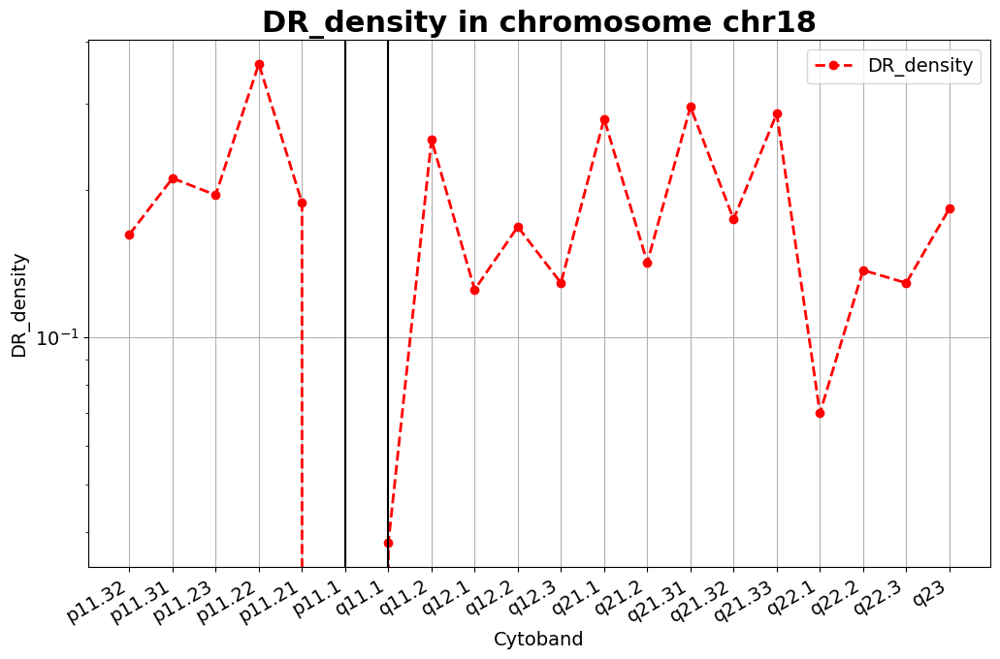

In [31]:
plot_1chr(cb_df, "chr18", "DR_density")

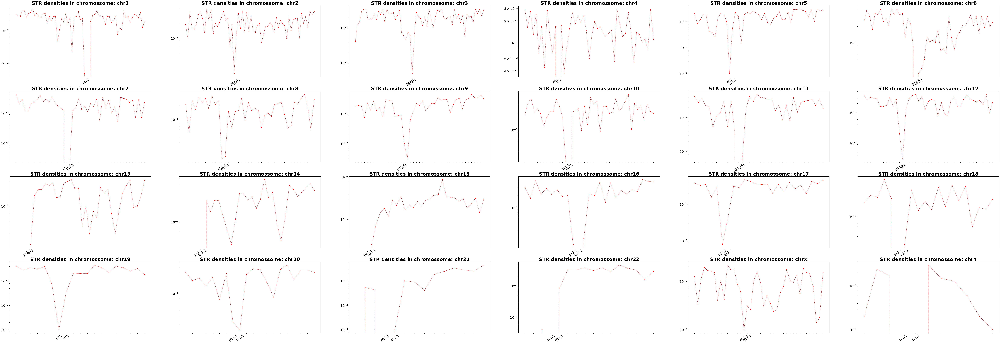

In [43]:
plotAll(cb_df, "DR_density")

In [13]:
#STR_dens = plotMap(dens_map, dict_map)

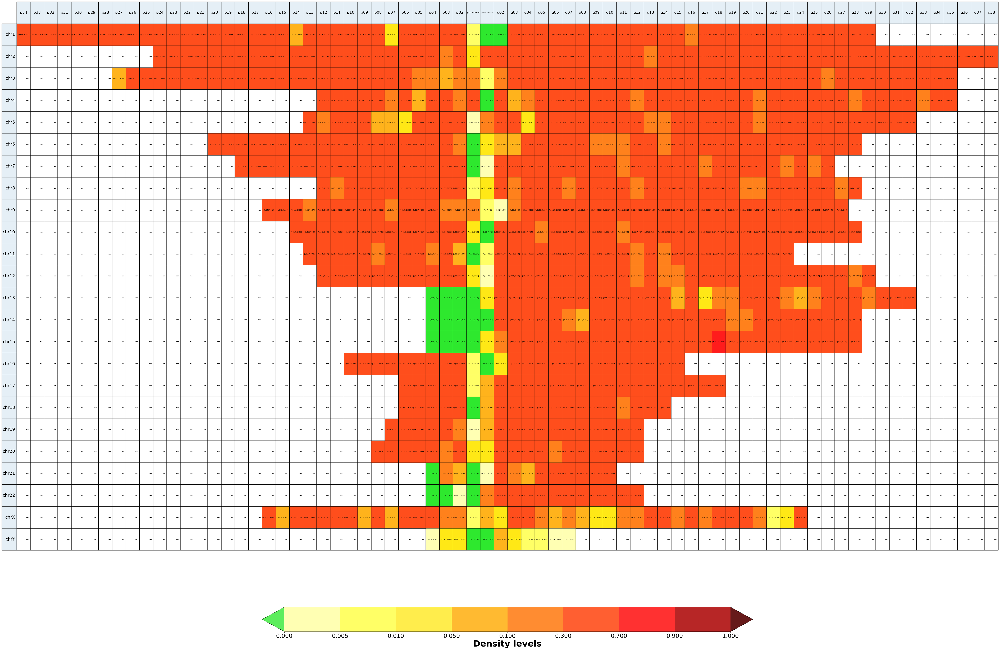

In [33]:
DR_dens = plotMap(dens_map, dict_map)

In [15]:
#pdf = matplotlib.backends.backend_pdf.PdfPages("images/STR_dens_map.pdf")
#pdf.savefig(STR_dens)
#pdf.savefig(map_legend)
#pdf.close()

In [21]:
def plotMap(data, dict):
    #rows = ('chr1', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr19', 'chr2', 'chr20', 'chr21', 'chr22', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9', 'chrX', 'chrY')
    rows = ('chr1', 'chr2', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr19', 'chr20', 'chr21', 'chr22', 'chrX', 'chrY')
    cols = ["p34", "p33", "p32", "p31", "p30", "p29", "p28", "p27", "p26", "p25", "p24", "p23", "p22", "p21", "p20", "p19", "p18", "p17", "p16", "p15", "p14", "p13", "p12", "p11", "p10", "p09", "p08", "p07", "p06", "p05", "p04", "p03", "p02", "p01-centromer", "q01-centromer", "q02", "q03", "q04", "q05", "q06", "q07", "q08", "q09", "q10", "q11", "q12", "q13", "q14", "q15", "q16", "q17", "q18", "q19", "q20", "q21", "q22", "q23", "q24", "q25", "q26", "q27", "q28", "q29", "q30", "q31", "q32", "q33", "q34", "q35", "q36", "q37", "q38"]
    n_rows = len(data)
    n_cols = len(data[0])

    # Plot bars and create text labels for the table
    cell_text = []
    for row in rows:
        cell_text.append(dict[row])

    #Get some lists of color specs for row and column headers
    rcolors = plt.cm.BuPu(np.full(len(rows), 0.1))
    ccolors = plt.cm.BuPu(np.full(len(cols), 0.1))
    cellcolours = cColours(data)
    
    fig = plt.figure(linewidth=2,
           #edgecolor=fig_border,
           #facecolor=fig_background_color,
           tight_layout={'pad':1},
           figsize = (58, 32),
          )
    
    partition1 = fig.add_subplot(2, 1, 1)
    the_table = plt.table(cellText=cell_text,
                      rowLabels=rows,
                      colLabels=cols,
                      rowLoc='right',
                      rowColours=rcolors,
                      colColours=ccolors,
                      cellColours=cellcolours,
                      loc='center')
    
    the_table.auto_set_font_size(False)
    the_table.set_fontsize(6)
    the_table.scale(1, 8)

    table_cells = the_table.properties()["celld"]
    #print(table_cells.keys())
    cells = the_table.properties()["children"]
    #for cell in cells:
    #    print(cell)
    
    for i in range(len(cells[-24:])):
        the_table[i+1, -1].set_width(0.80)
        the_table[i+1, -1].set_fontsize(18)

    for j in range(72):
        if j != 33 and j != 34:
            the_table[0, j].set_fontsize(16)
        else:
            the_table[0, j].set_fontsize(7)

    #the_table.auto_set_column_width(-1)
    
    partition1.add_table(the_table)
    # Hide axes
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # Hide axes border
    plt.box(on=None)
    
    partition2 = fig.add_subplot(2,1,2)
    partition2.axis('off')
    colormap = (mpl.colors.ListedColormap([green, lYelw, yelw, dYelw, lOrng, orng, dOrng, lred, Red, dRed]))
    
    bounds = [0, 0.005, 0.010, 0.05, 0.1, 0.3, 0.7, 0.9, 1]
    norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')
    
    the_colorbar= fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=colormap), ax=partition2, orientation='horizontal', label='Density levels', shrink= 1/2)
    #shrink
    the_colorbar.ax.tick_params(labelsize=24)
    the_colorbar.set_label(label='Density levels', size=36,weight='bold')
    # Create image. plt.savefig ignores figure edge and face colors, so map them.
    plt.draw()
    #STR_dens_map = plt.gcf()
    
    #plt.savefig('images/STR_density_map.pdf', format="pdf", bbox_inches="tight")
    #plt.savefig('images/DR_density_map.png', format="png", bbox_inches="tight", dpi=300)
    plt.savefig('images/DR_density_map.pdf', format="pdf", bbox_inches="tight")

In [17]:
#STR_dens = plotMap(dens_map, dict_map)

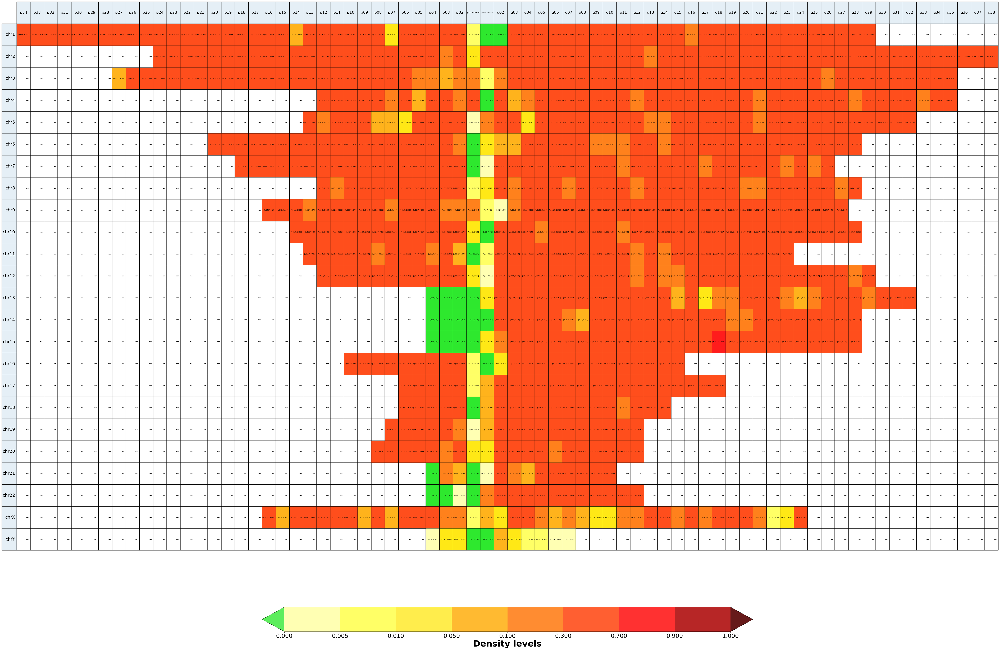

In [34]:
DR_dens = plotMap(dens_map, dict_map)

In [8]:
citoband_read = "/home/androx/Documents/trabalho/citobands/cytobandFiltered_processed_str_dr_dg_ordered.txt"
cb_df = pd.read_csv(citoband_read, sep="\t")
cb_df

,Chromossome,First_index,Last_index,Citoband,Unkown,Size,STR_Density,DR_density,CDSs_density,Exons_density,Introns_density,OtherRegions_density
0,chr1,0,2299999,p36.33,gneg,2299999,0.088,0.326,0.038,0.171,0.022,0.112
1,chr1,2300000,5299999,p36.32,gpos25,2999999,0.084,0.282,0.016,0.079,0.011,0.051
2,chr1,5300000,7099999,p36.31,gneg,1799999,0.056,0.275,0.024,0.082,0.010,0.044
3,chr1,7100000,9099999,p36.23,gpos25,1999999,0.049,0.405,0.013,0.047,0.004,0.019
4,chr1,9100000,12499999,p36.22,gneg,3399999,0.056,0.404,0.030,0.093,0.010,0.030
...,...,...,...,...,...,...,...,...,...,...,...,...
858,chrY,12400000,17099999,q11.221,gpos50,4699999,0.037,0.015,0.004,0.016,0.001,0.002
859,chrY,17100000,19599999,q11.222,gneg,2499999,0.062,0.013,0.002,0.045,0.004,0.004
860,chrY,19600000,23799999,q11.223,gpos50,4199999,0.082,0.006,0.005,0.036,0.004,0.002
861,chrY,23800000,26599999,q11.23,gneg,2799999,0.026,0.002,0.003,0.034,0.002,0.003


In [15]:
def make_one_Dens(cytoband_df, dens = "Exons_density"):
    dens_map = makeMap_dens(cytoband_df, dens)
    dict_map= makeMap_dict(cytoband_df, dens)

    plot_1chr(cytoband_df, "chr20", dens)
    plotAll(cytoband_df, dens)
    plotMap(dens_map, dict_map)

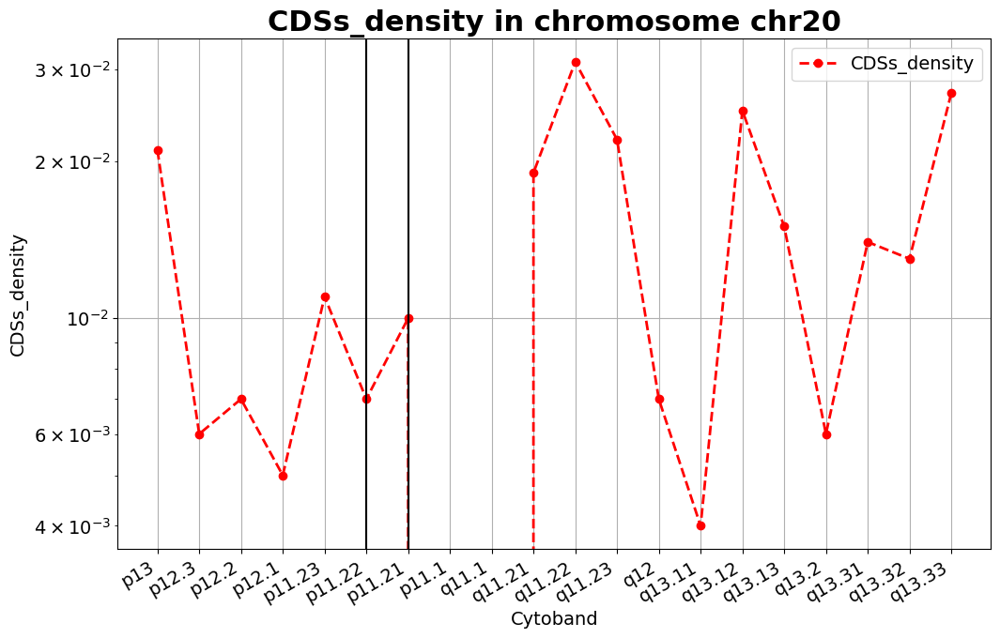

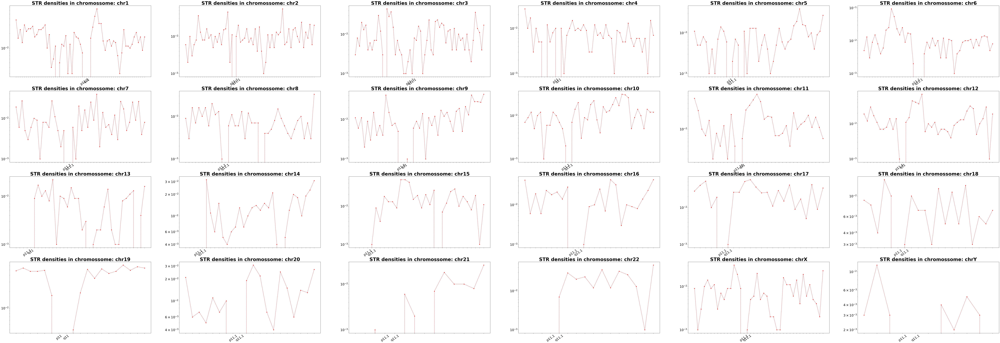

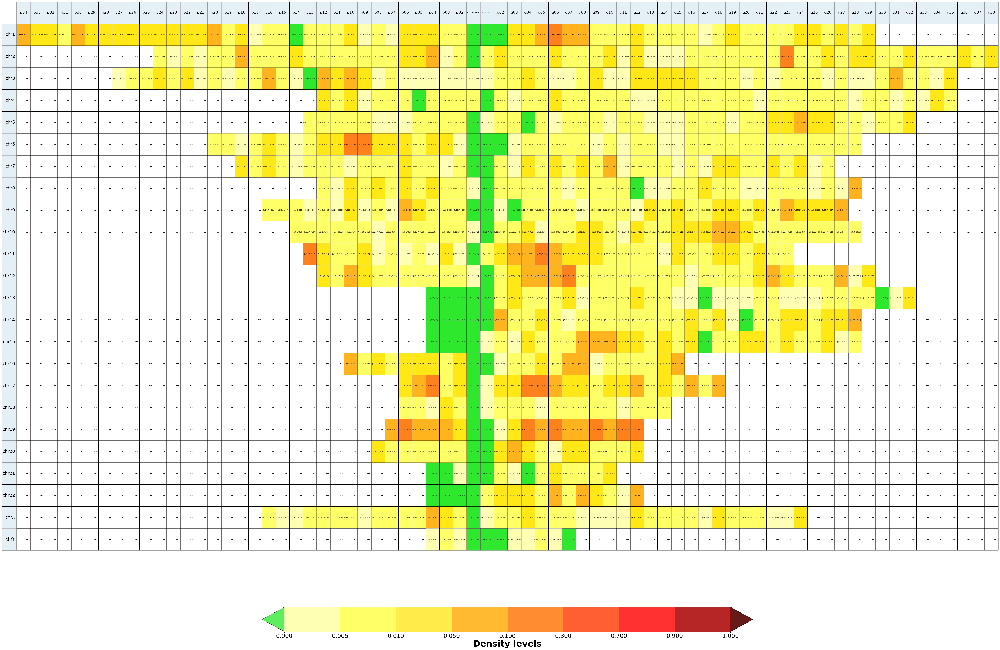

In [25]:
make_one_Dens(cb_df, "CDSs_density")

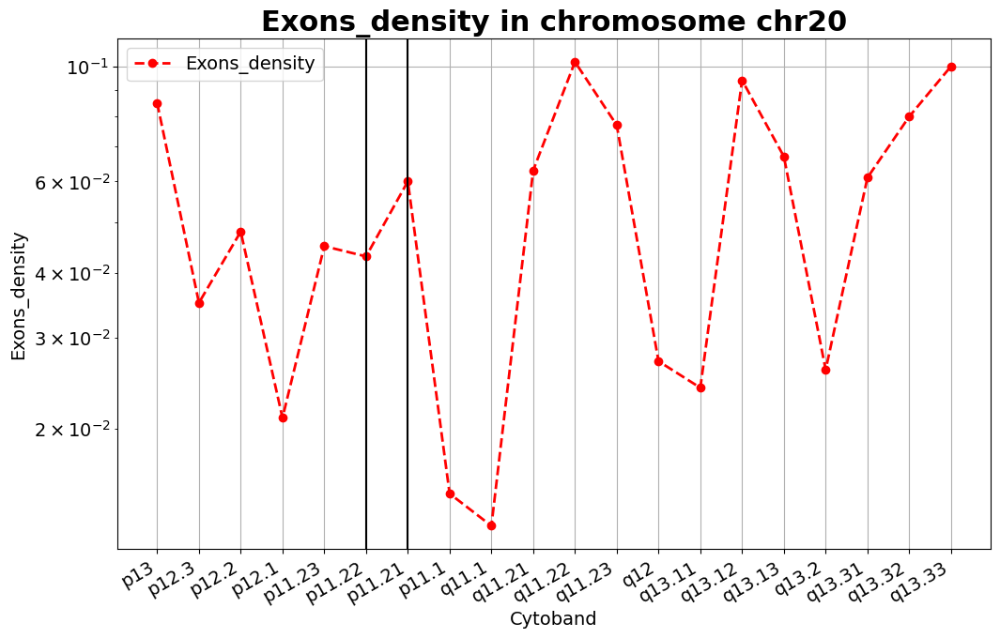

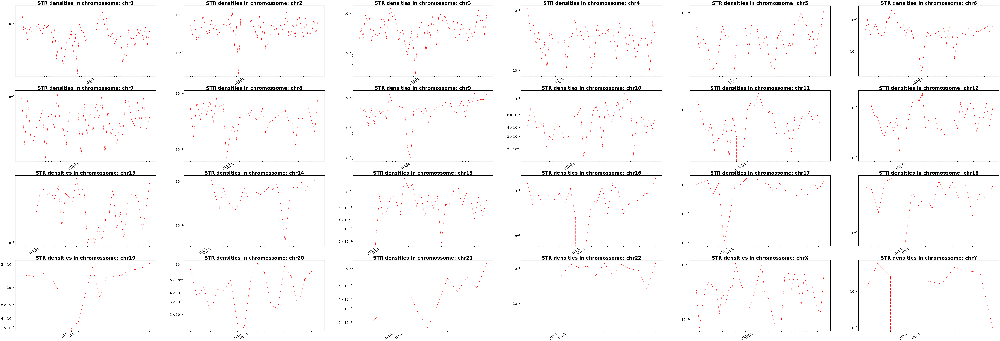

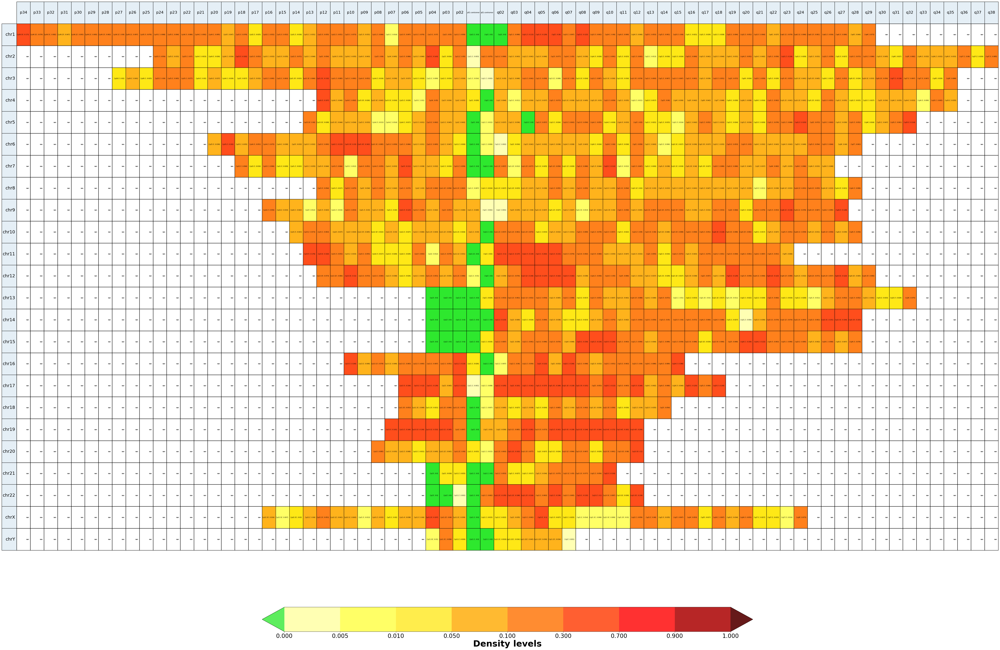

In [26]:
make_one_Dens(cb_df, "Exons_density")

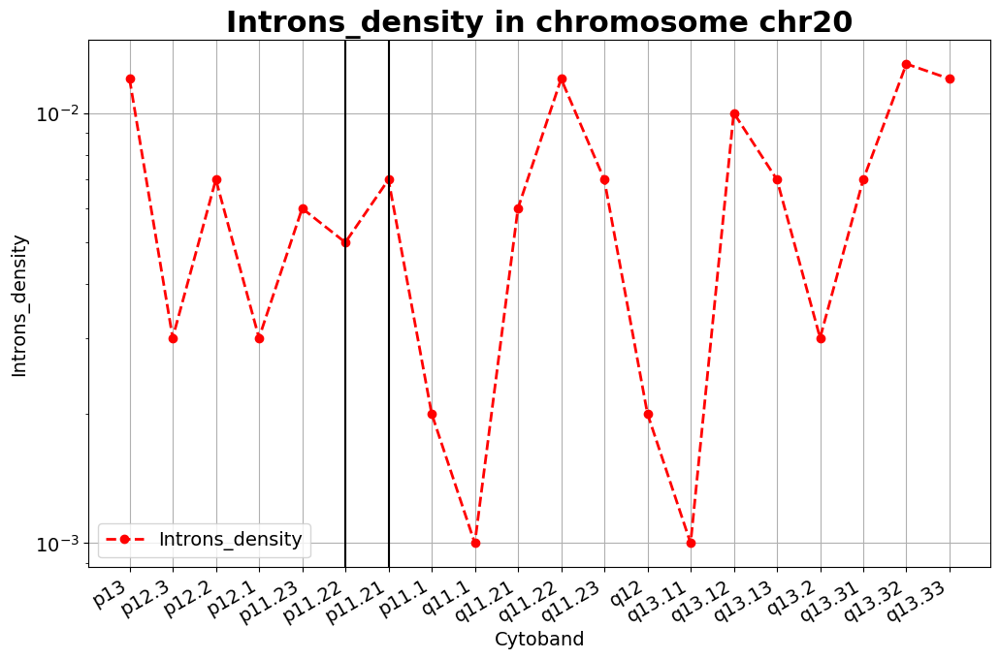

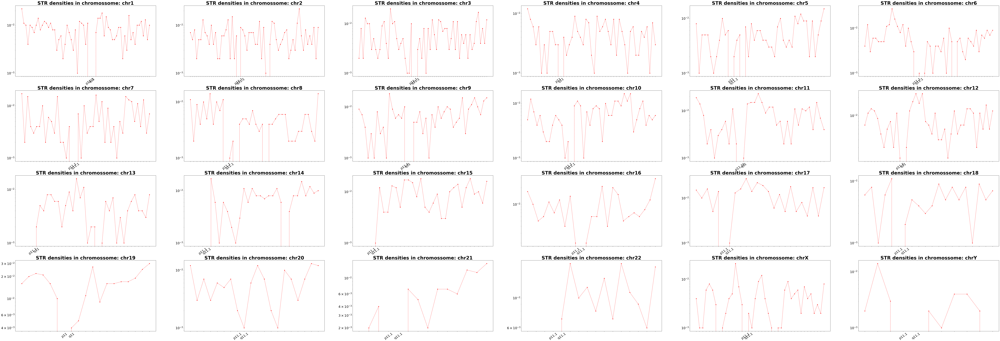

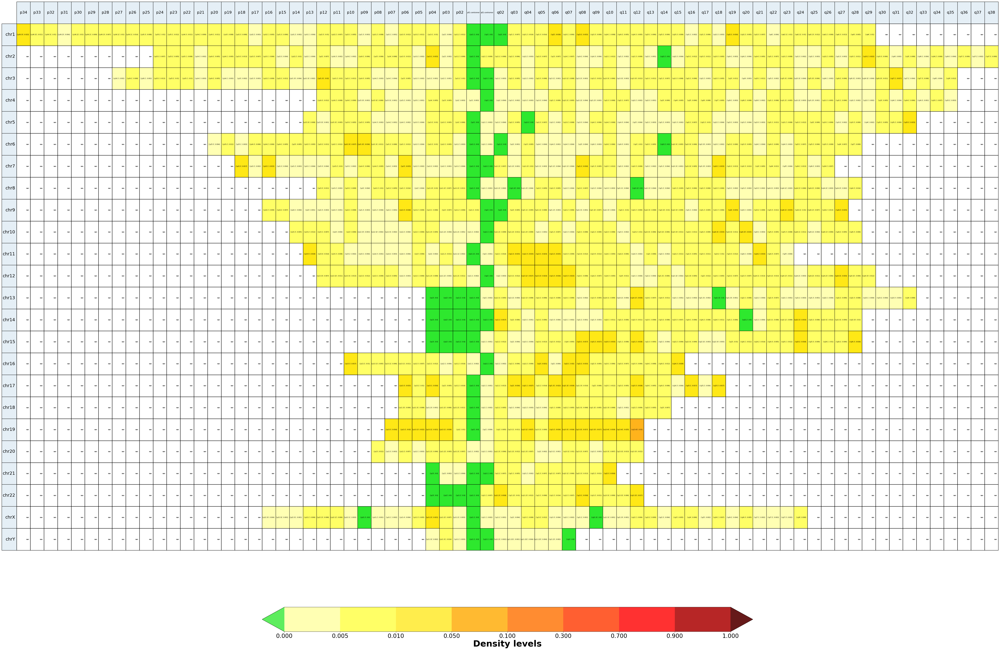

In [27]:
make_one_Dens(cb_df, "Introns_density")

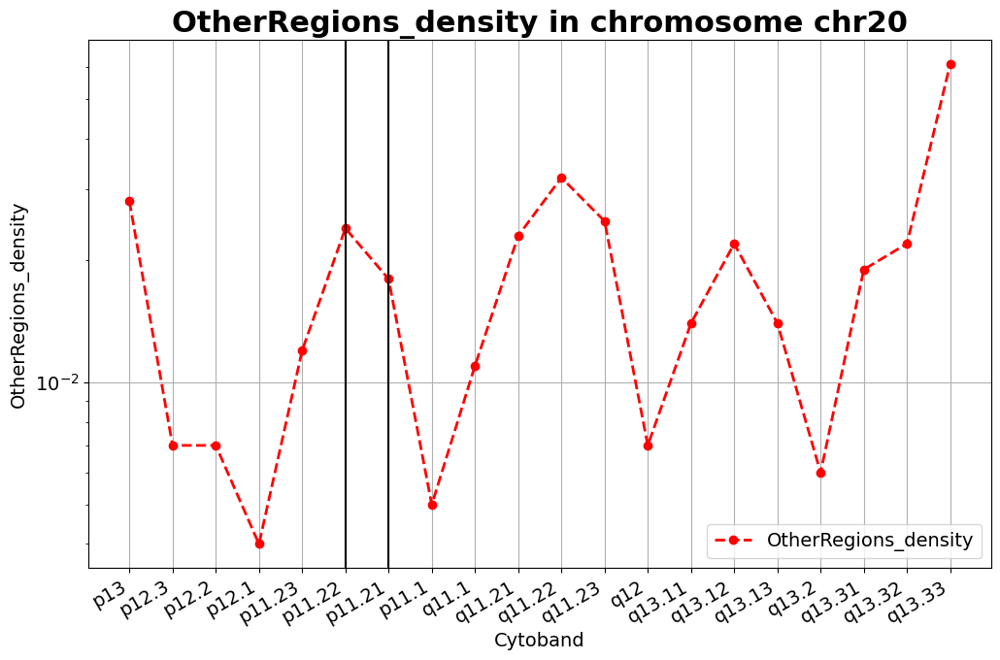

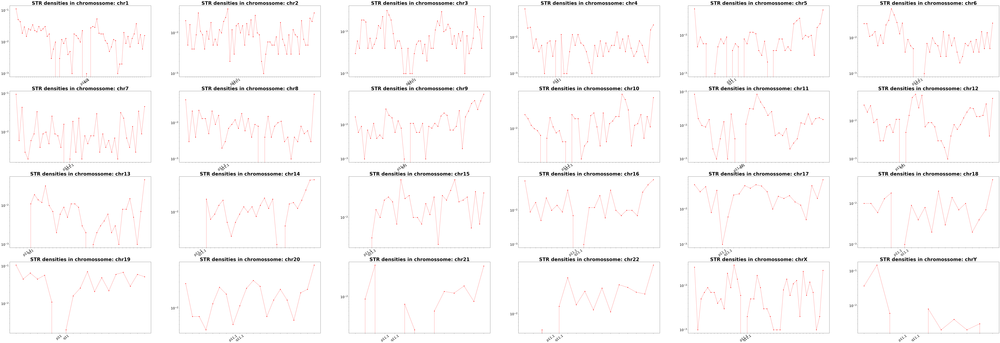

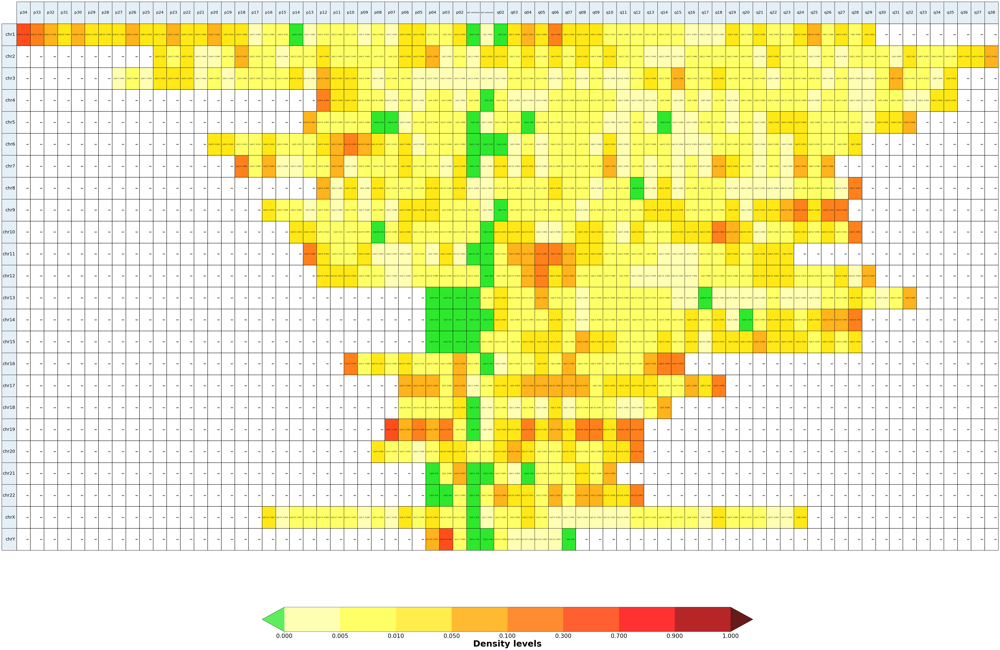

In [28]:
make_one_Dens(cb_df, "OtherRegions_density")